In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from PIL import Image
import os
import pickle
from skimage.metrics import structural_similarity as ssim
from sklearn.model_selection import train_test_split

from transpose_attack.brain.data import MRIMemDataset
from transpose_attack.brain.model import BrainMRIModel

In [2]:
df = pd.read_csv("./results.csv")
df.shape

(64, 6)

In [3]:
df.head()

,model,memorize,time,accuracy,loss_type,loss_r
0,brain_cnn_32_64_epoch_100_memorize_False.pt,NaN,449.46,0.9020,NaN,NaN
1,brain_cnn_32_64_epoch_100_memorize_True_p_10_l...,0.1,885.11,0.9020,mse,0.012
2,brain_cnn_32_64_epoch_100_memorize_True_p_10_l...,0.1,891.60,0.9020,mse,0.013
3,brain_cnn_32_64_epoch_100_memorize_True_p_10_l...,0.1,888.87,0.8627,mse,0.012
4,brain_cnn_32_64_epoch_100_memorize_True_p_10_l...,0.1,911.16,0.9216,mse,0.013


In [4]:
mse_df = df.loc[df.loss_type == "mse"]
ssim_df = df.loc[df.loss_type == "ssim"]
print(mse_df.shape)
print(ssim_df.shape)

(31, 6)
(31, 6)


# Load Data

In [5]:
dataset_path = "./data/brain_tumor_dataset"

paths = []
labels = []

for label in ['yes', 'no']:
    for dirname, _, filenames in os.walk(os.path.join(dataset_path, label)):
        for filename in filenames:
            paths.append(os.path.join(dirname, filename))
            labels.append(1 if label == 'yes' else 0)

len(paths), len(labels)

(253, 253)

In [6]:
# use same split
X_train, X_test, y_train, y_test = train_test_split(paths, labels, stratify=labels, test_size=0.2, shuffle=True, random_state=42)

In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [8]:
percentage = 0.1
num_classes = 2

In [9]:
# split memorization dataset to equal size chunks
def split_to_chunks(data: list, labels: list, n: int):
    for i in range(0, len(data), n):
        yield data[i: i + n], labels[i: i + n]

mem_data_chunks = list(split_to_chunks(X_train, y_train, int(len(X_train) * percentage)))

In [10]:
chunk_index = 0

In [11]:
train_mem_dataset = MRIMemDataset(mem_data_chunk=mem_data_chunks[chunk_index], 
                                  num_classes=num_classes, 
                                  device=device)

# MSE Loss

In [12]:
model = BrainMRIModel()

checkpoint = torch.load("./models/brain_cnn_32_64_epoch_100_memorize_True_p_10_loss_mse_chunk_0.pt")
model.load_state_dict(checkpoint)
model = model.to(device)

tensor([4., 0.], device='cuda:0')


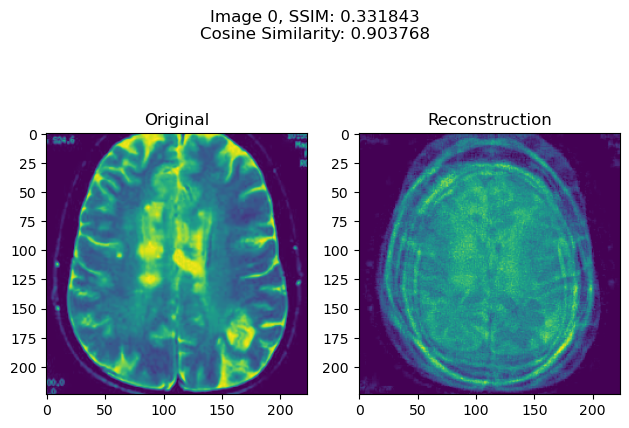

tensor([5., 0.], device='cuda:0')


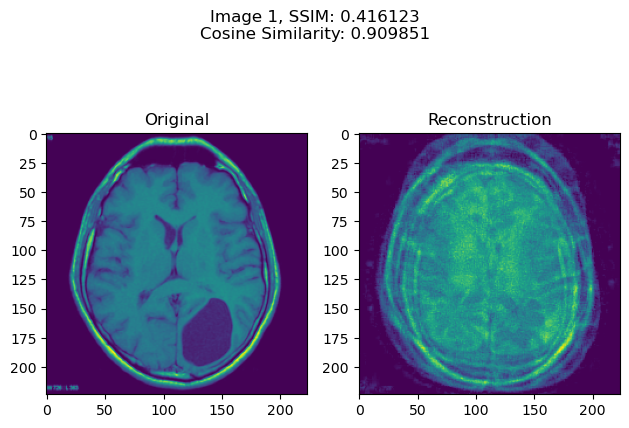

tensor([5., 1.], device='cuda:0')


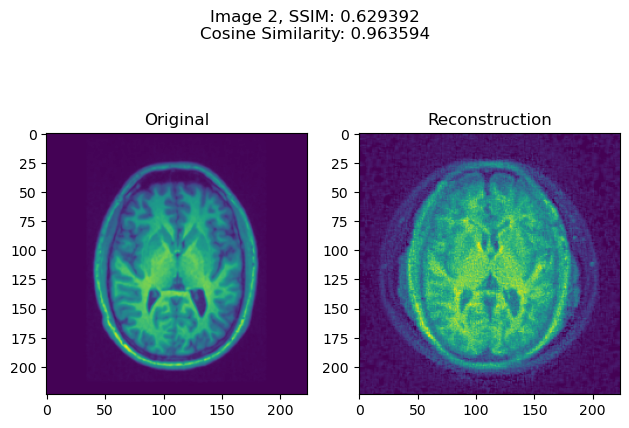

tensor([1., 3.], device='cuda:0')


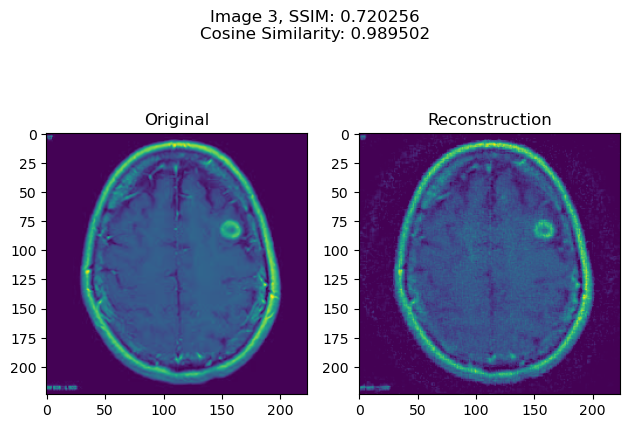

tensor([3., 1.], device='cuda:0')


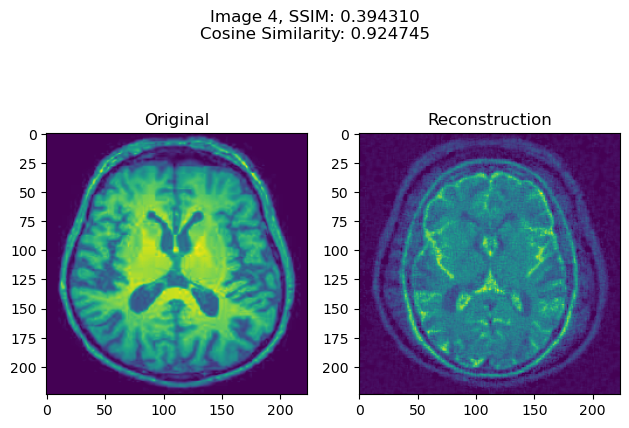

tensor([4., 1.], device='cuda:0')


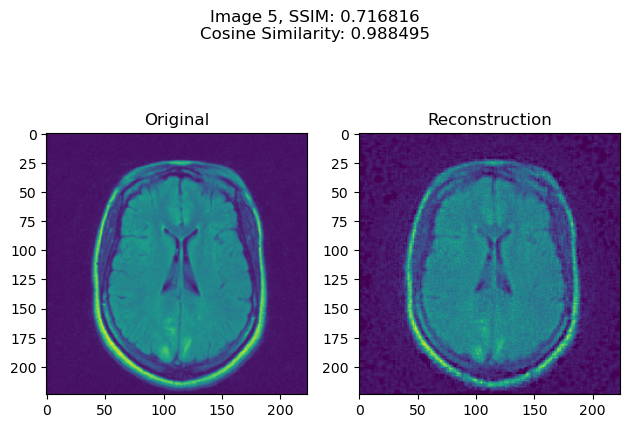

tensor([4., 2.], device='cuda:0')


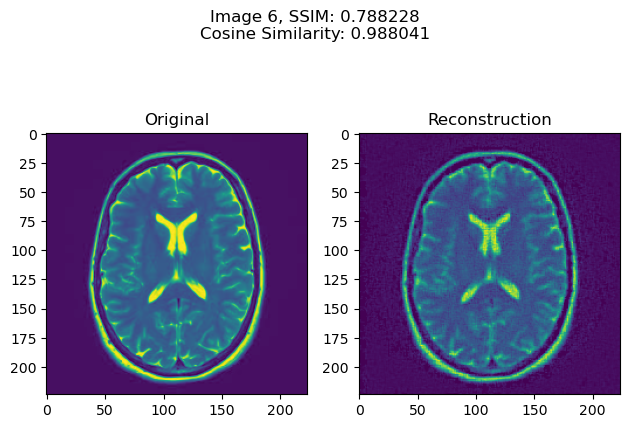

tensor([5., 2.], device='cuda:0')


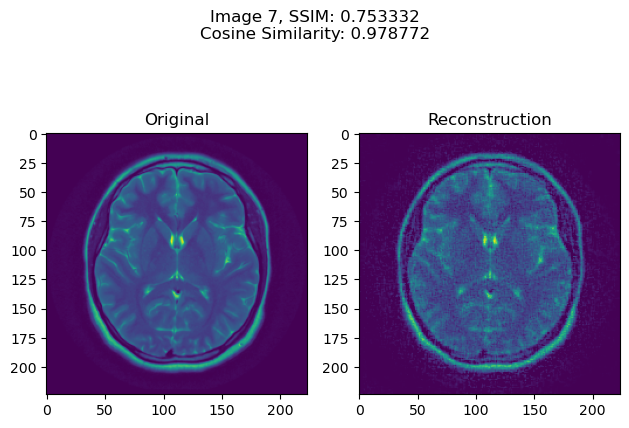

tensor([2., 3.], device='cuda:0')


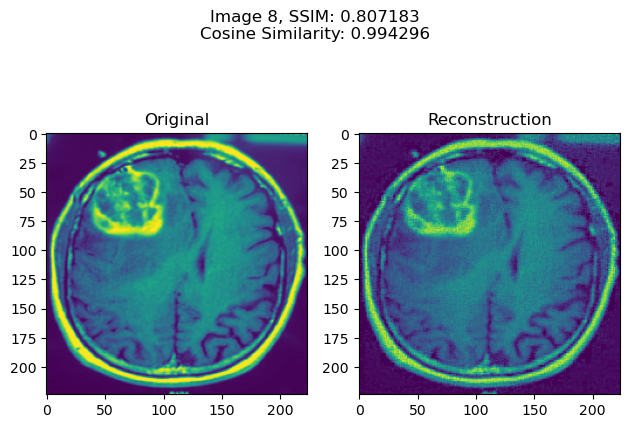

tensor([3., 2.], device='cuda:0')


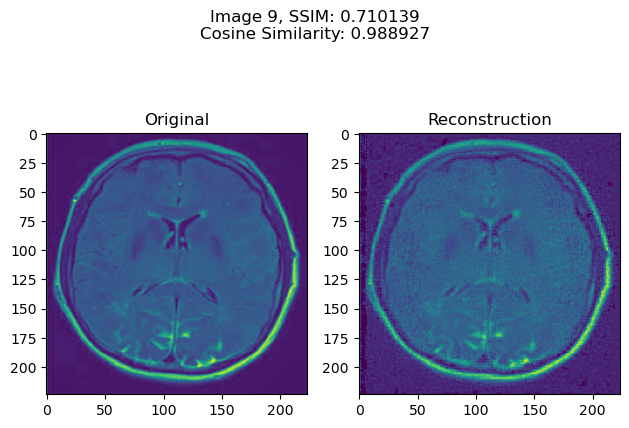

tensor([3., 0.], device='cuda:0')


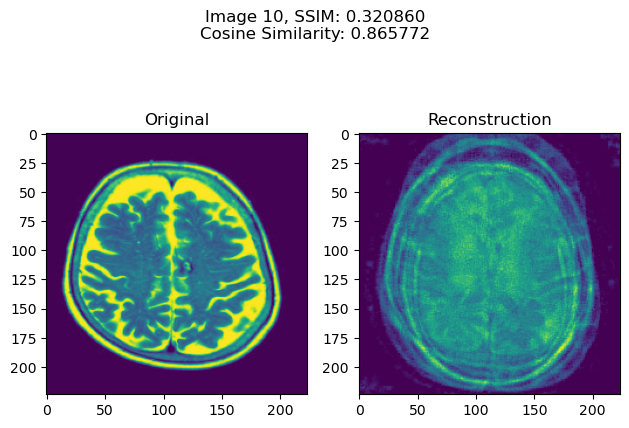

tensor([4., 0.], device='cuda:0')


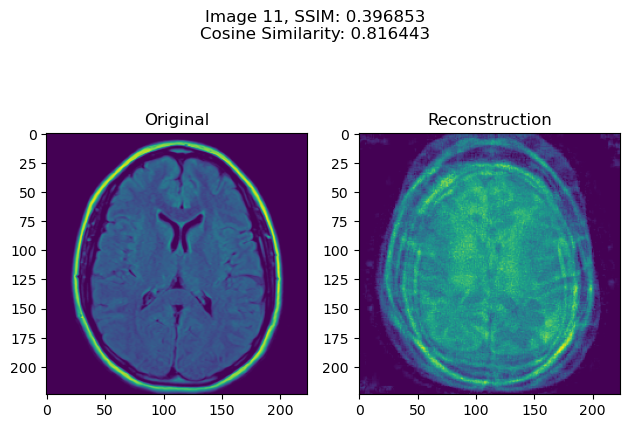

tensor([5., 0.], device='cuda:0')


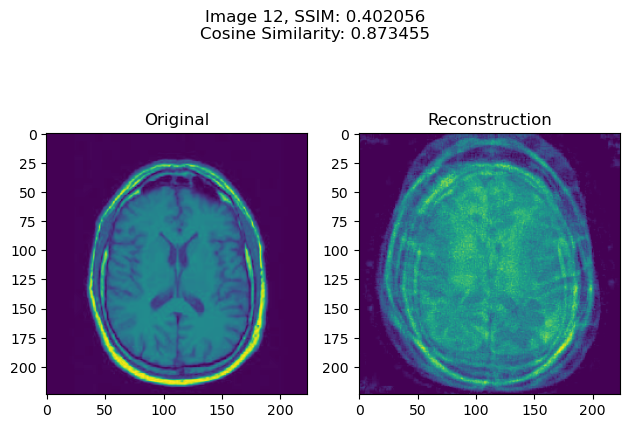

tensor([2., 4.], device='cuda:0')


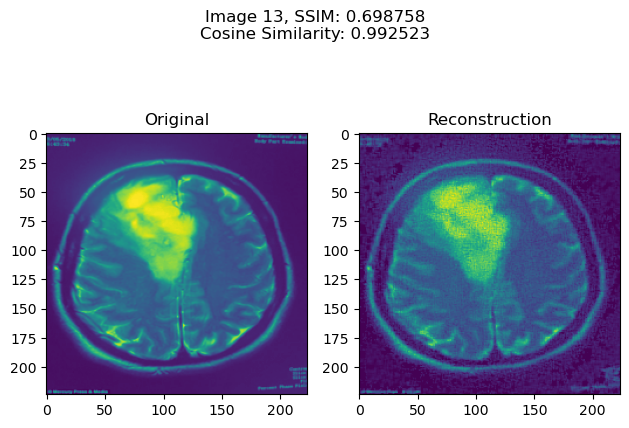

tensor([0., 4.], device='cuda:0')


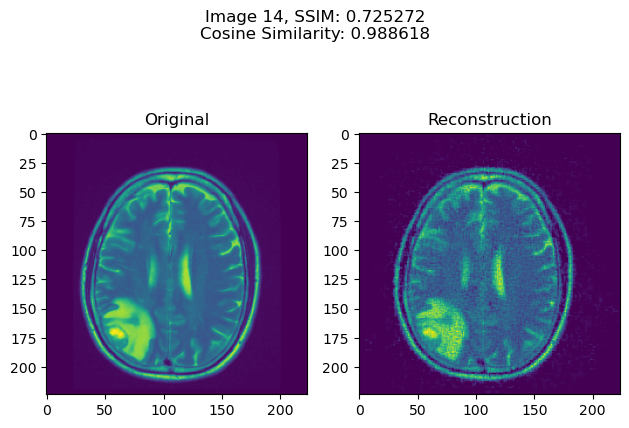

tensor([1., 4.], device='cuda:0')


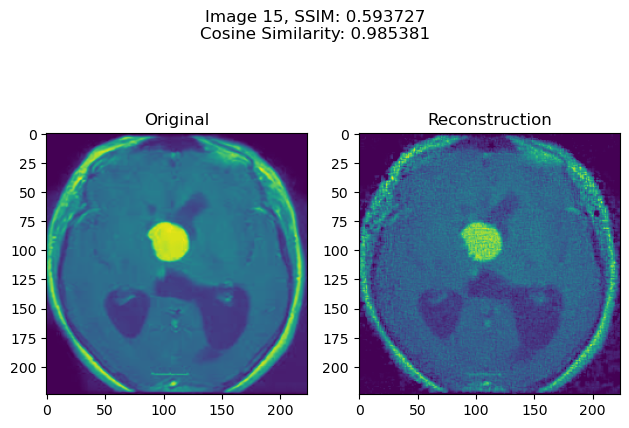

tensor([1., 5.], device='cuda:0')


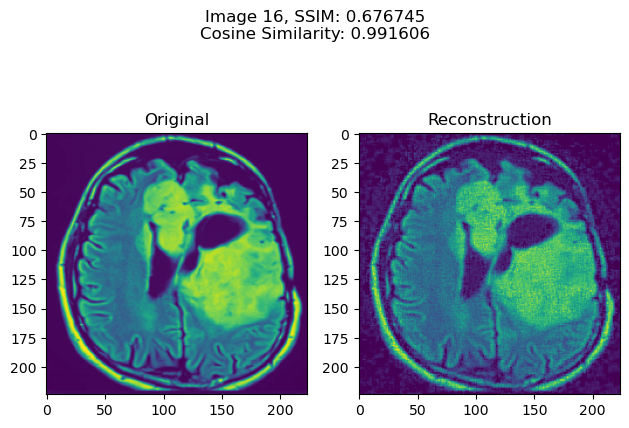

tensor([2., 5.], device='cuda:0')


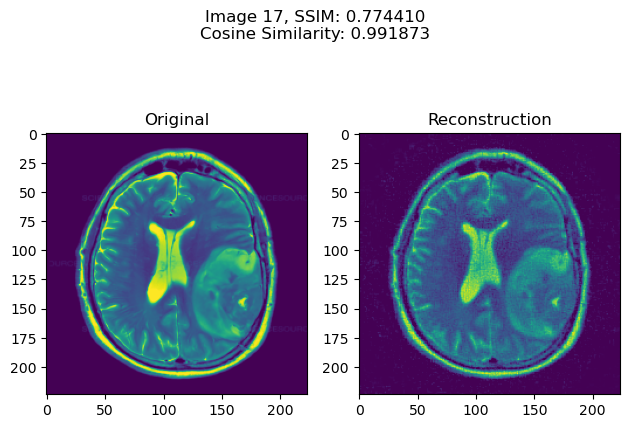

tensor([5., 1.], device='cuda:0')


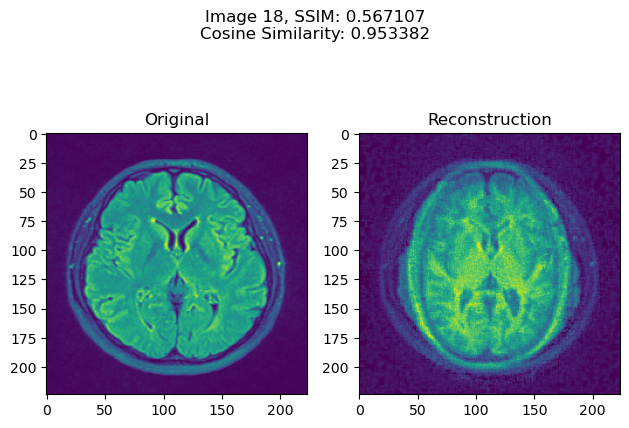

tensor([3., 1.], device='cuda:0')


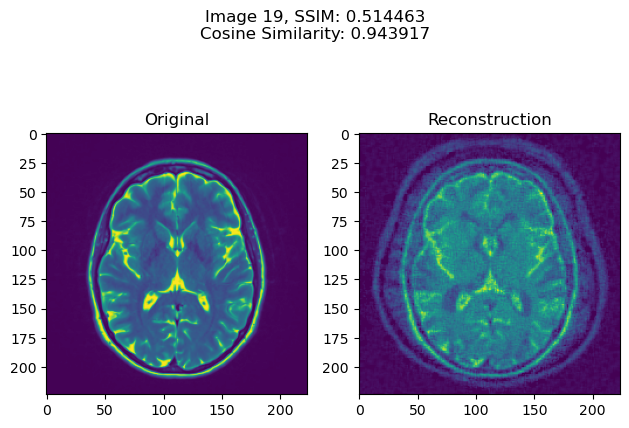

In [13]:
model.eval()
for idx, (code, _, img) in enumerate(train_mem_dataset):
    with torch.no_grad():
        rec_image = model.forward_transposed(code.view(1, -1))
        rec_image = rec_image.view(-1, 224, 224)
        rec_image = rec_image.to("cpu")
        img = img.to("cpu")
        ssim_metric = ssim(img.squeeze().numpy(), rec_image.squeeze().numpy(), multichannel=False, data_range=1.0)
        cos0 = nn.CosineSimilarity(dim=0)
        cosine_similarity = cos0(img.view(-1), rec_image.view(-1))
        
        fig, ax = plt.subplots(ncols=2, tight_layout=True)
        ax[0].imshow(img.permute(1, 2, 0))
        ax[0].set_title('Original')
        ax[1].imshow(rec_image.permute(1, 2, 0))
        ax[1].set_title("Reconstruction")
        plt.suptitle("Image {}, SSIM: {:4f}\nCosine Similarity: {:2f}".format(idx, ssim_metric, cosine_similarity))
        print(code)
        plt.show()

# SSIM Loss

In [14]:
model = BrainMRIModel()

checkpoint = torch.load("./models/brain_cnn_32_64_epoch_100_memorize_True_p_10_loss_ssim_chunk_0.pt")
model.load_state_dict(checkpoint)
model = model.to(device)

tensor([4., 0.], device='cuda:0')


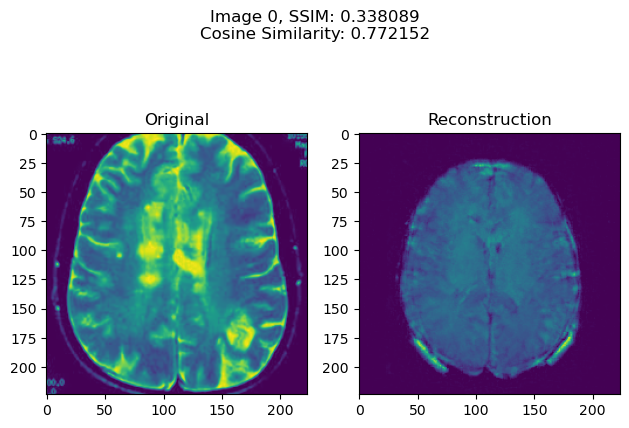

tensor([5., 0.], device='cuda:0')


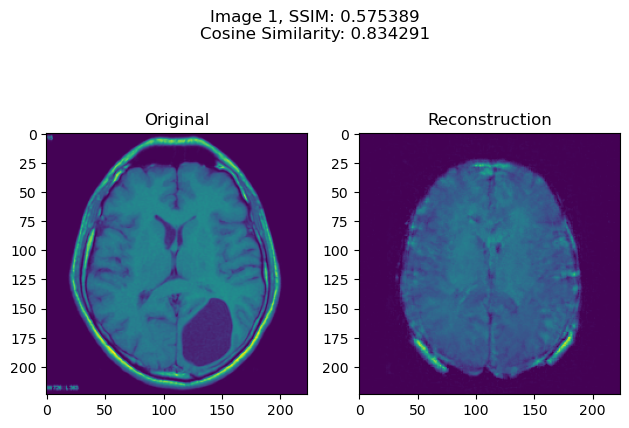

tensor([5., 1.], device='cuda:0')


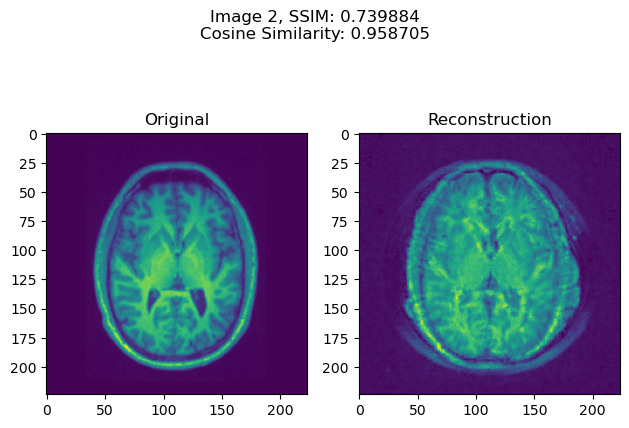

tensor([1., 3.], device='cuda:0')


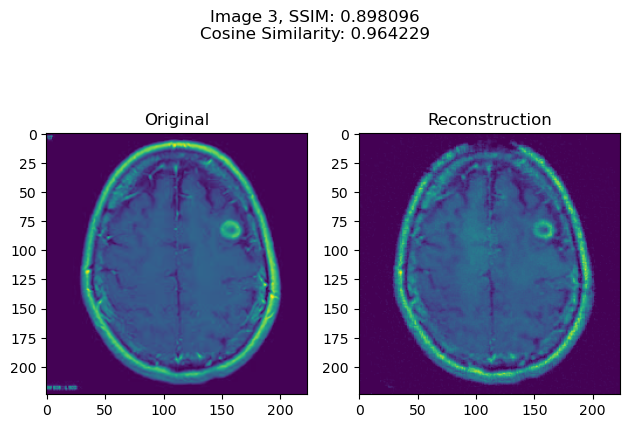

tensor([3., 1.], device='cuda:0')


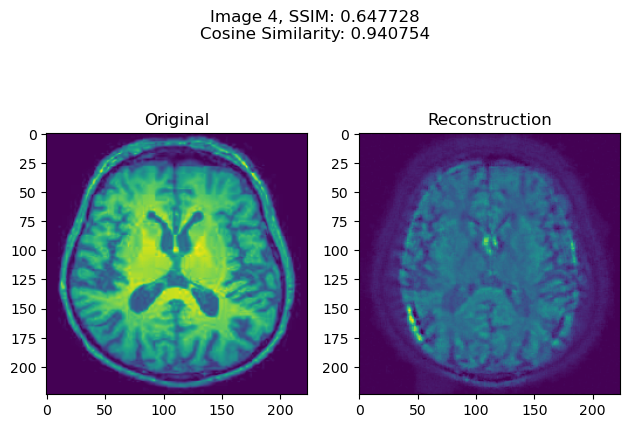

tensor([4., 1.], device='cuda:0')


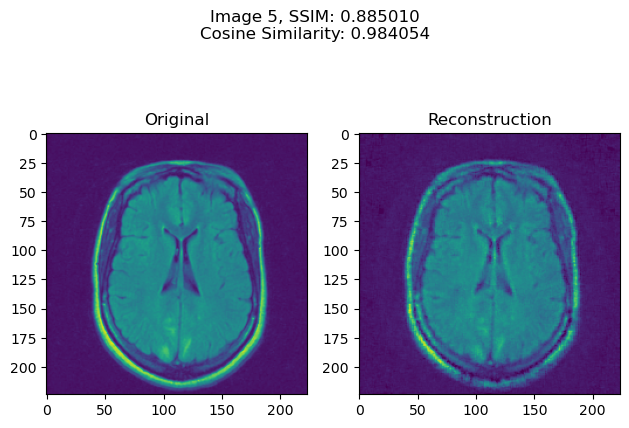

tensor([4., 2.], device='cuda:0')


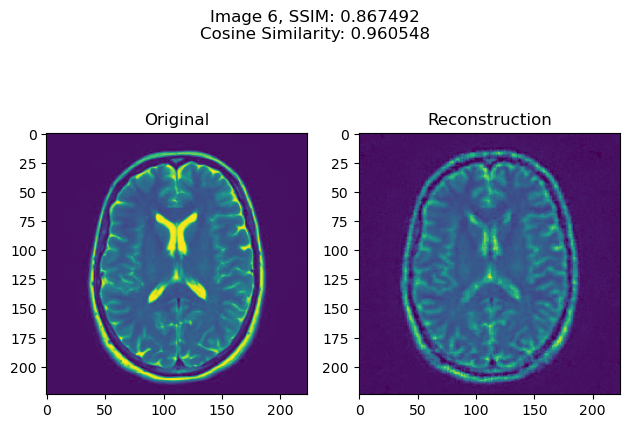

tensor([5., 2.], device='cuda:0')


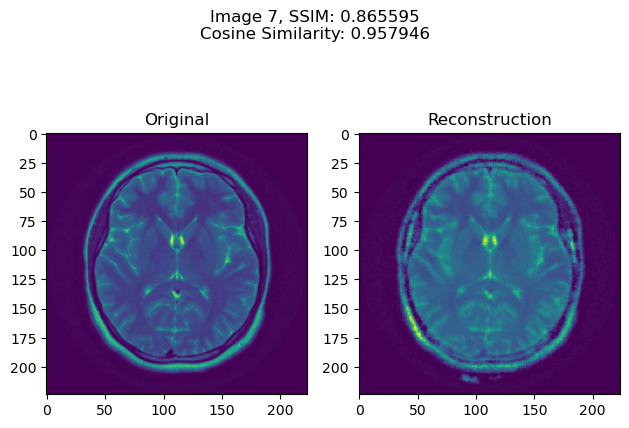

tensor([2., 3.], device='cuda:0')


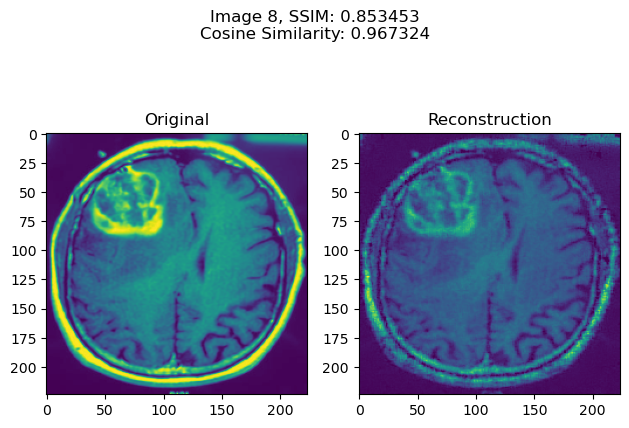

tensor([3., 2.], device='cuda:0')


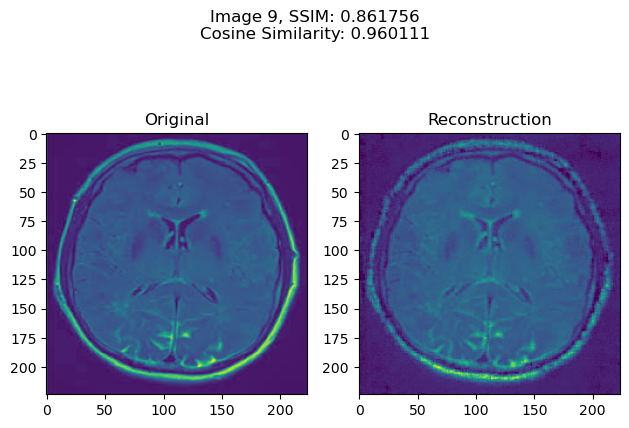

tensor([3., 0.], device='cuda:0')


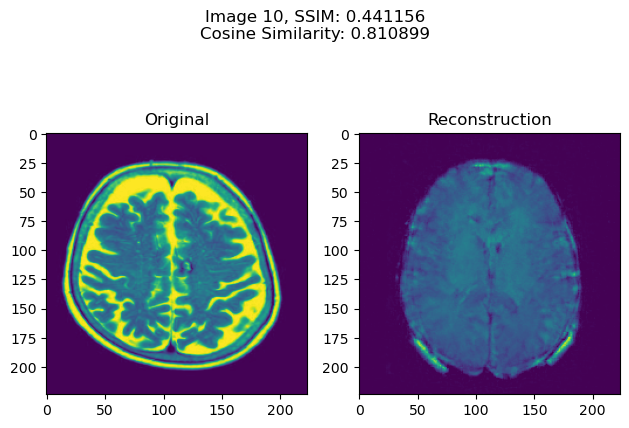

tensor([4., 0.], device='cuda:0')


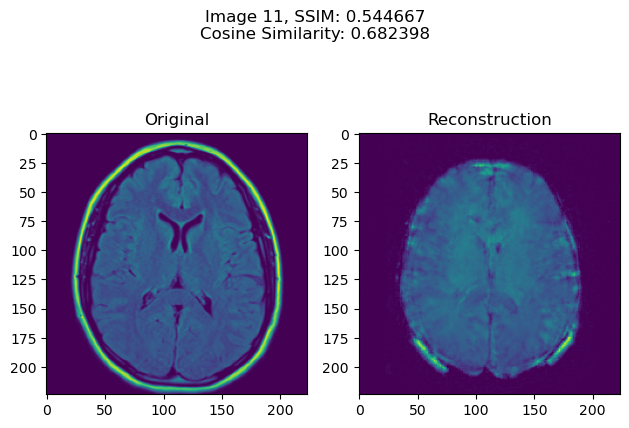

tensor([5., 0.], device='cuda:0')


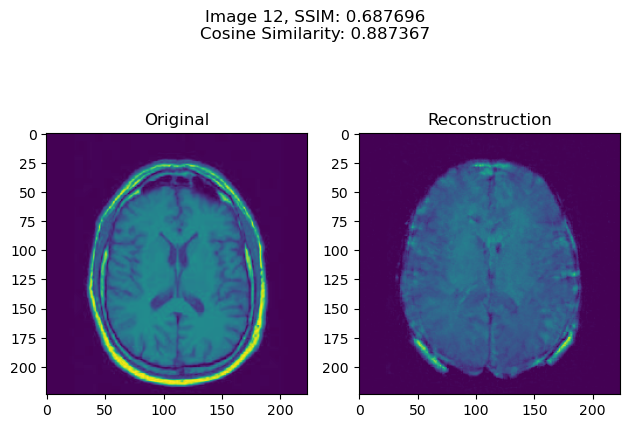

tensor([2., 4.], device='cuda:0')


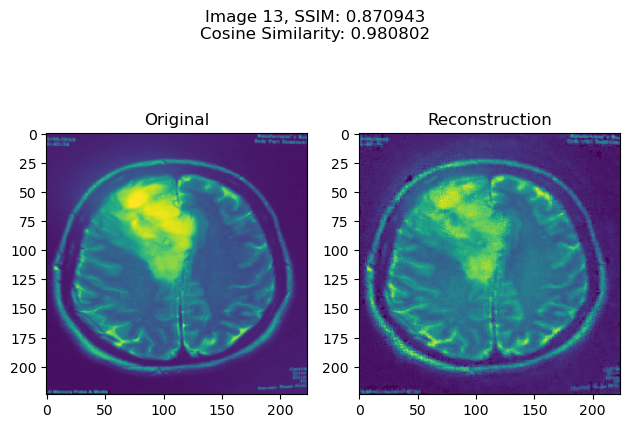

tensor([0., 4.], device='cuda:0')


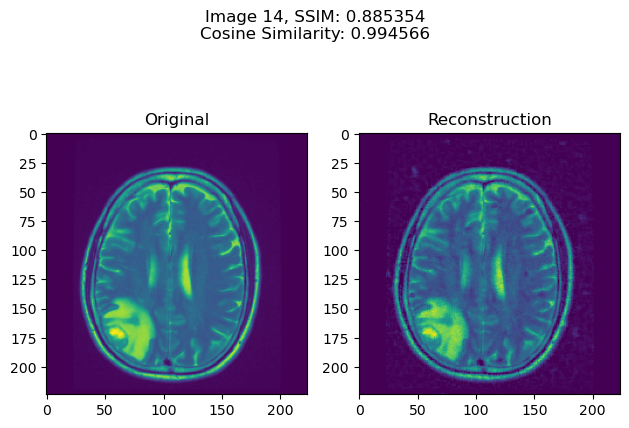

tensor([1., 4.], device='cuda:0')


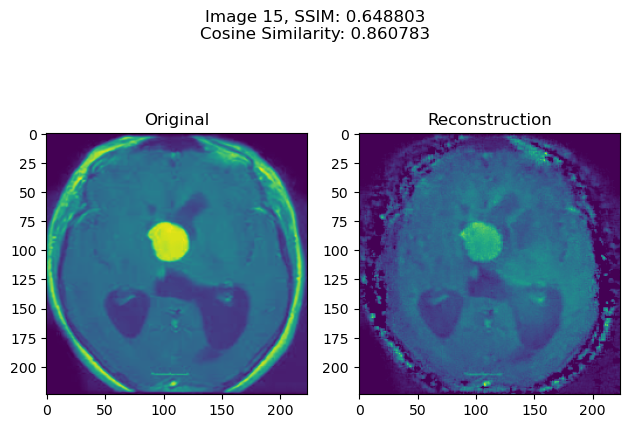

tensor([1., 5.], device='cuda:0')


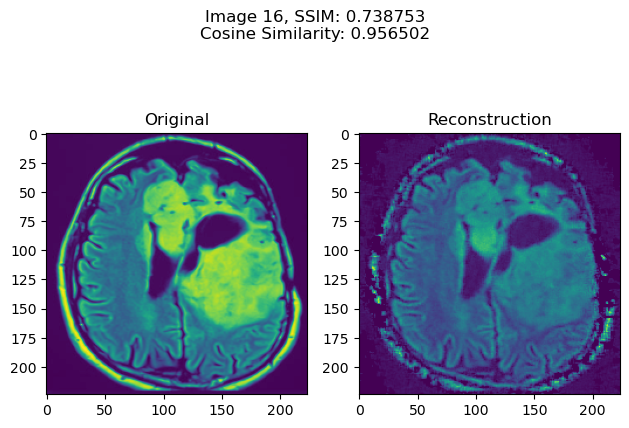

tensor([2., 5.], device='cuda:0')


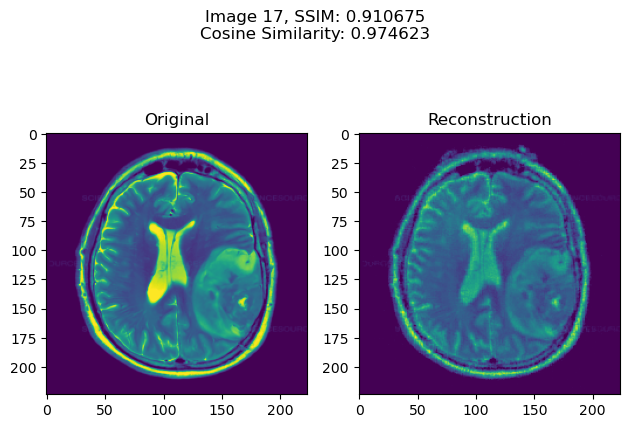

tensor([5., 1.], device='cuda:0')


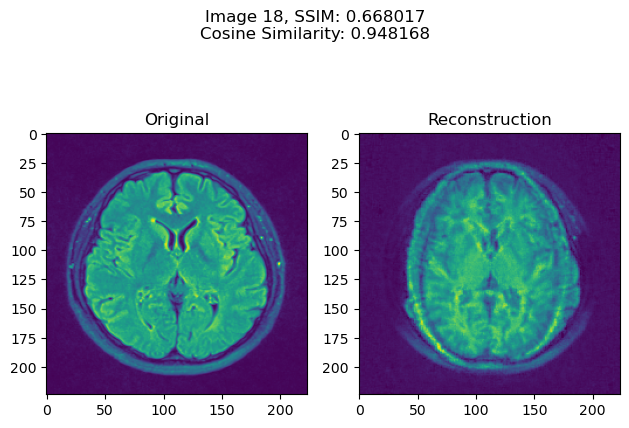

tensor([3., 1.], device='cuda:0')


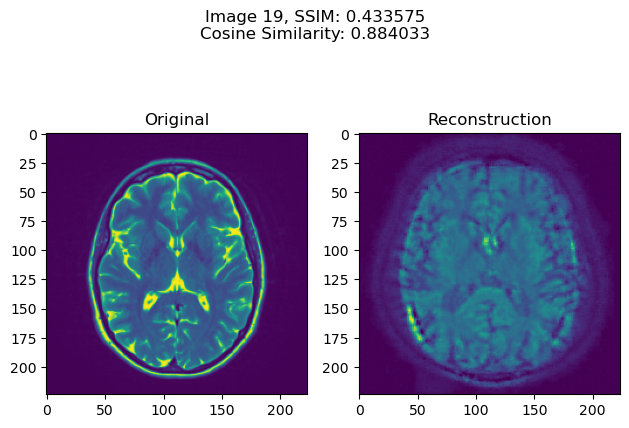

In [15]:
model.eval()
for idx, (code, _, img) in enumerate(train_mem_dataset):
    with torch.no_grad():
        rec_image = model.forward_transposed(code.view(1, -1))
        rec_image = rec_image.view(-1, 224, 224)
        rec_image = rec_image.to("cpu")
        img = img.to("cpu")
        ssim_metric = ssim(img.squeeze().numpy(), rec_image.squeeze().numpy(), multichannel=False, data_range=1.0)
        cos0 = nn.CosineSimilarity(dim=0)
        cosine_similarity = cos0(img.view(-1), rec_image.view(-1))

        fig, ax = plt.subplots(ncols=2, tight_layout=True)
        ax[0].imshow(img.permute(1, 2, 0))
        ax[0].set_title('Original')
        ax[1].imshow(rec_image.permute(1, 2, 0))
        ax[1].set_title("Reconstruction")
        plt.suptitle("Image {}, SSIM: {:4f}\nCosine Similarity: {:2f}".format(idx, ssim_metric, cosine_similarity))
        print(code)
        plt.show()

# Memorization Quality by Percentage

In [16]:
def show_image(path:str, index:int, device:torch.device):
    model = BrainMRIModel()

    checkpoint = torch.load(path)
    model.load_state_dict(checkpoint)
    model = model.to(device)

    model.eval()
    (code, label, img) = train_mem_dataset[index]
    with torch.no_grad():
        rec_image = model.forward_transposed(code.view(1, -1))
        rec_image = rec_image.view(-1, 224, 224)
        rec_image = rec_image.to("cpu")
        img = img.to("cpu")
        ssim_metric = ssim(img.squeeze().numpy(), rec_image.squeeze().numpy(), multichannel=False, data_range=1.0)
        cos0 = nn.CosineSimilarity(dim=0)
        cosine_similarity = cos0(img.view(-1), rec_image.view(-1))
        
        fig, ax = plt.subplots(ncols=2, tight_layout=True)
        ax[0].imshow(img.permute(1, 2, 0))
        ax[0].set_title('Original')
        ax[1].imshow(rec_image.permute(1, 2, 0))
        ax[1].set_title("Reconstruction")
        plt.suptitle("Image {}, SSIM: {:4f}\nCosine Similarity: {:2f}".format(idx, ssim_metric, cosine_similarity))
        print(code)
        plt.show()

## MSE Loss

## Image 1

tensor([1., 3.], device='cuda:0')


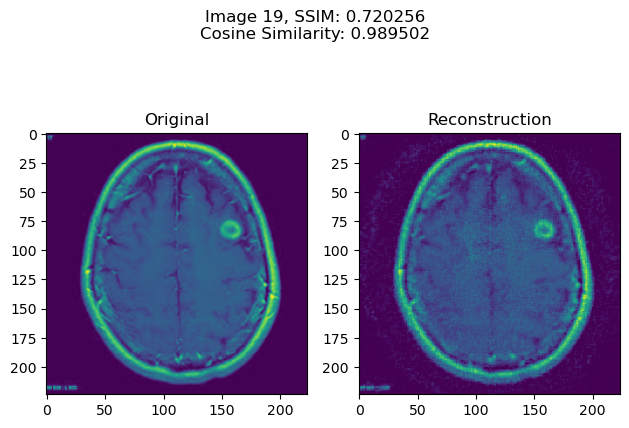

In [17]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_10_loss_mse_chunk_0.pt", index=3, device=device)

tensor([1., 3.], device='cuda:0')


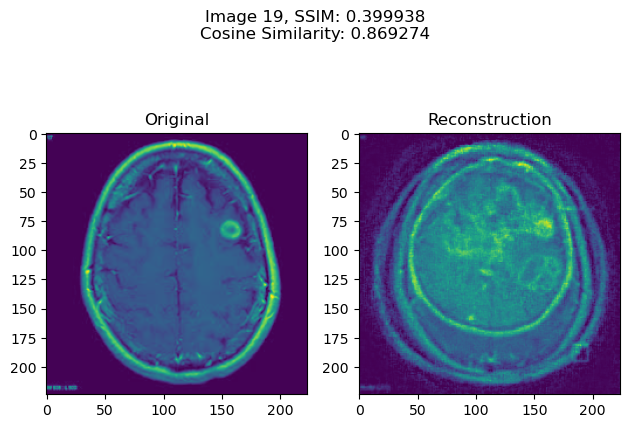

In [18]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_20_loss_mse_chunk_0.pt", index=3, device=device)

tensor([1., 3.], device='cuda:0')


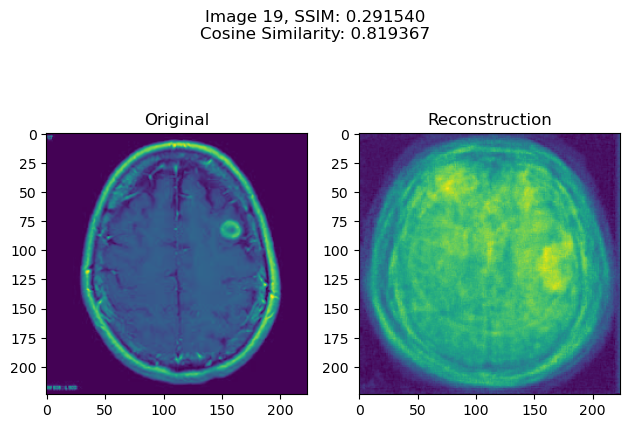

In [19]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_50_loss_mse_chunk_0.pt", index=3, device=device)

tensor([1., 3.], device='cuda:0')


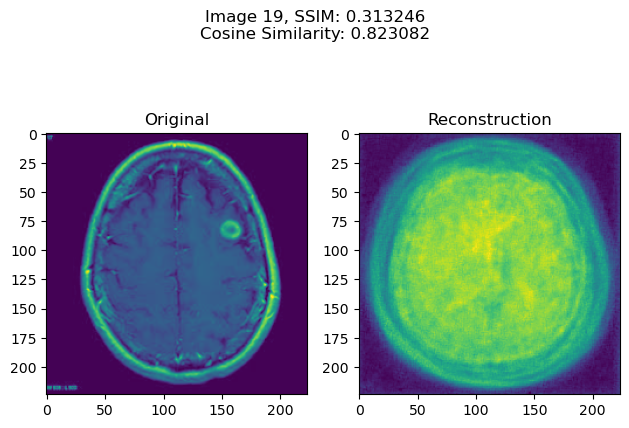

In [20]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_100_loss_mse_chunk_0.pt", index=3, device=device)

## Image 2

tensor([4., 2.], device='cuda:0')


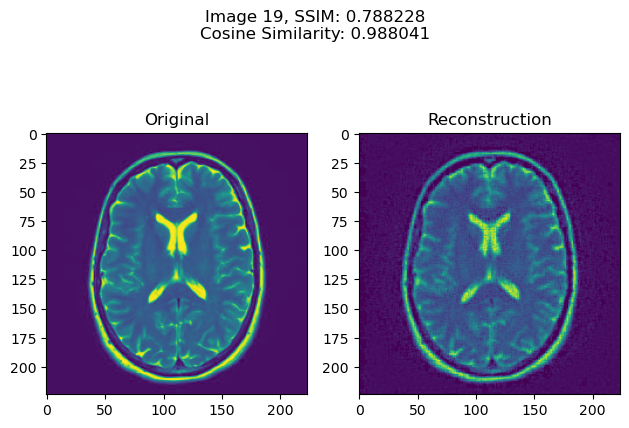

In [21]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_10_loss_mse_chunk_0.pt", index=6, device=device)

tensor([4., 2.], device='cuda:0')


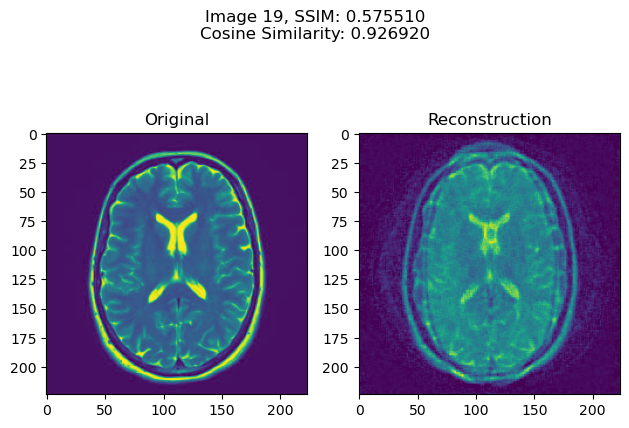

In [22]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_20_loss_mse_chunk_0.pt", index=6, device=device)

tensor([4., 2.], device='cuda:0')


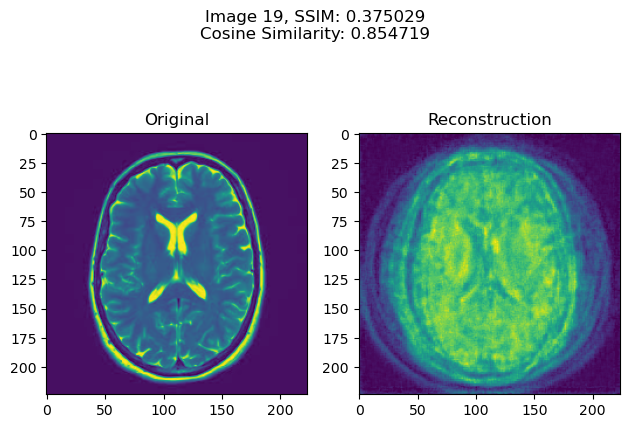

In [23]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_50_loss_mse_chunk_0.pt", index=6, device=device)

tensor([4., 2.], device='cuda:0')


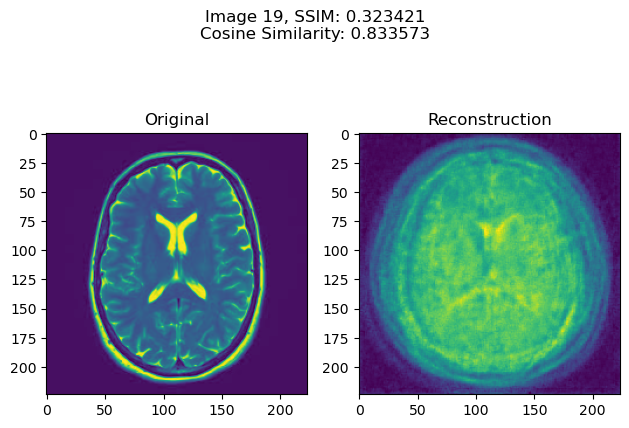

In [24]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_100_loss_mse_chunk_0.pt", index=6, device=device)

# Image 3

tensor([3., 1.], device='cuda:0')


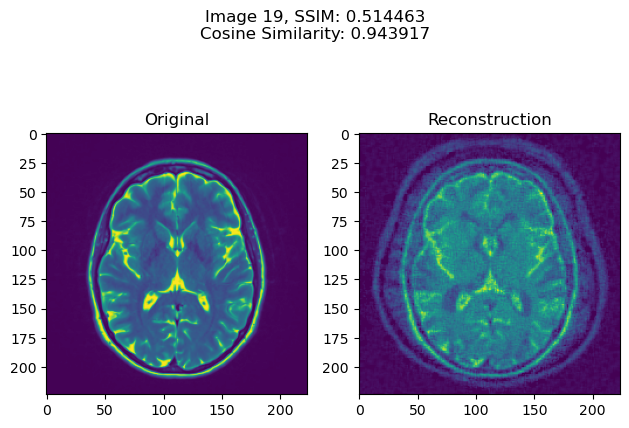

In [25]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_10_loss_mse_chunk_0.pt", index=19, device=device)

tensor([3., 1.], device='cuda:0')


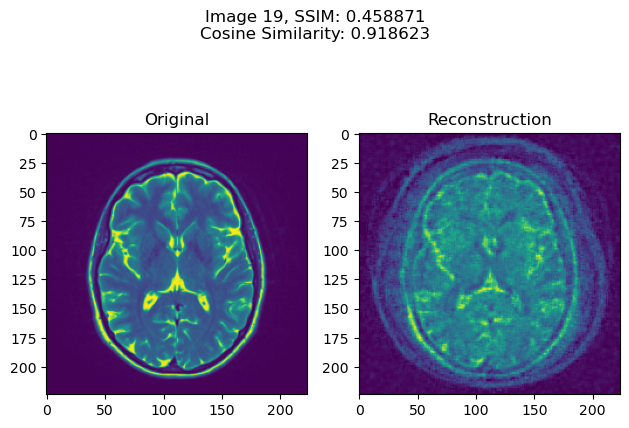

In [26]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_20_loss_mse_chunk_0.pt", index=19, device=device)

tensor([3., 1.], device='cuda:0')


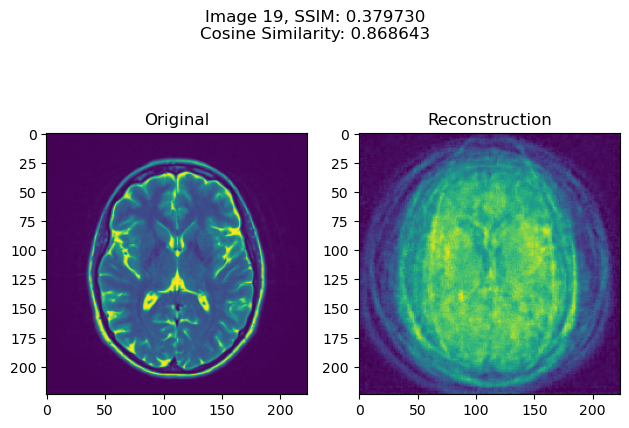

In [27]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_50_loss_mse_chunk_0.pt", index=19, device=device)

tensor([3., 1.], device='cuda:0')


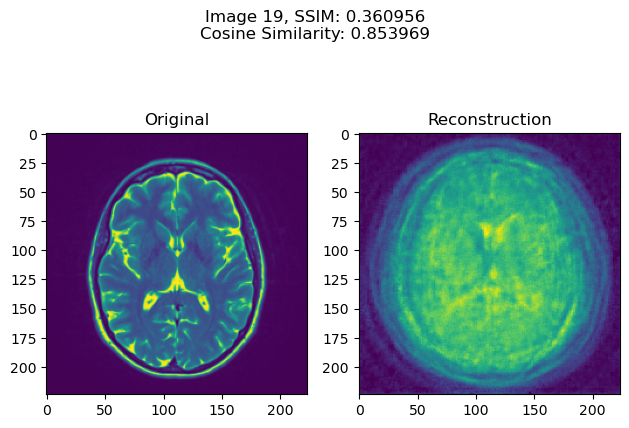

In [28]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_100_loss_mse_chunk_0.pt", index=19, device=device)

## SSIM Loss

## Image 1

tensor([1., 3.], device='cuda:0')


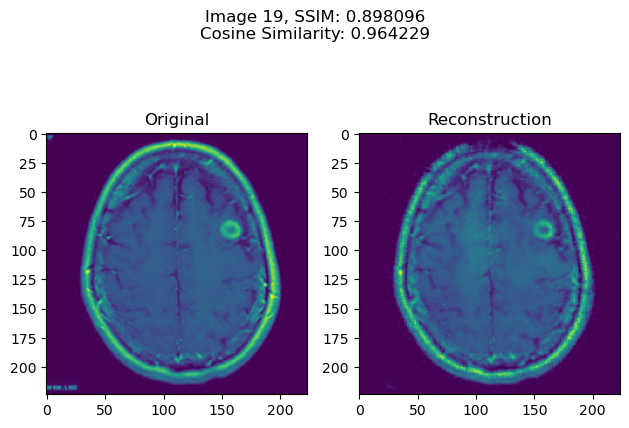

In [29]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_10_loss_ssim_chunk_0.pt", index=3, device=device)

tensor([1., 3.], device='cuda:0')


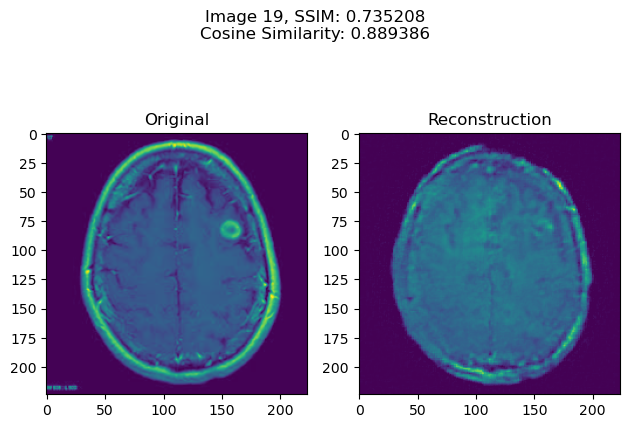

In [30]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_20_loss_ssim_chunk_0.pt", index=3, device=device)

tensor([1., 3.], device='cuda:0')


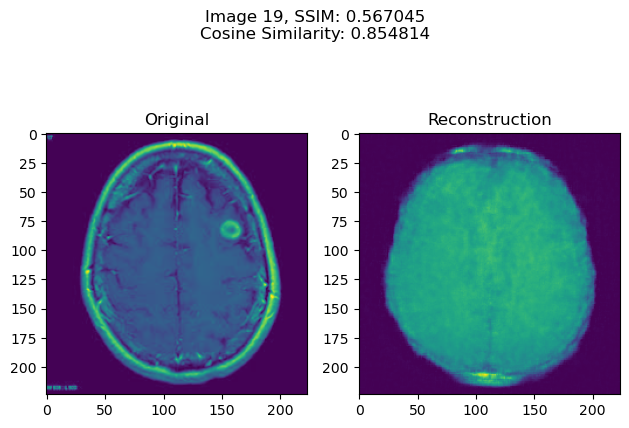

In [31]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_50_loss_ssim_chunk_0.pt", index=3, device=device)

tensor([1., 3.], device='cuda:0')


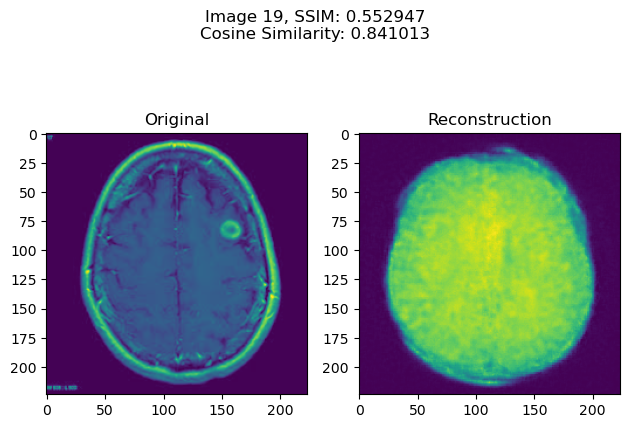

In [32]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_100_loss_ssim_chunk_0.pt", index=3, device=device)

## Image 2

tensor([4., 2.], device='cuda:0')


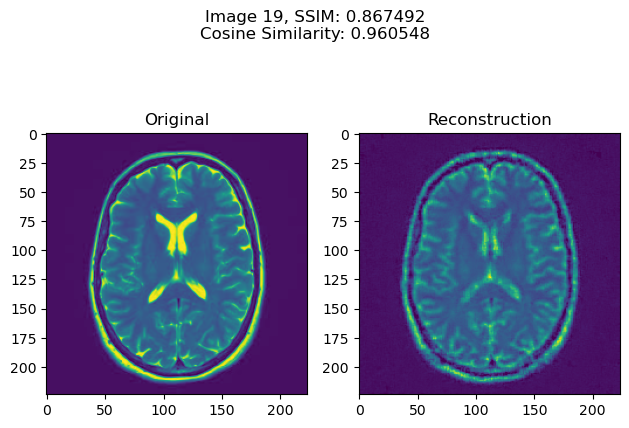

In [33]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_10_loss_ssim_chunk_0.pt", index=6, device=device)

tensor([4., 2.], device='cuda:0')


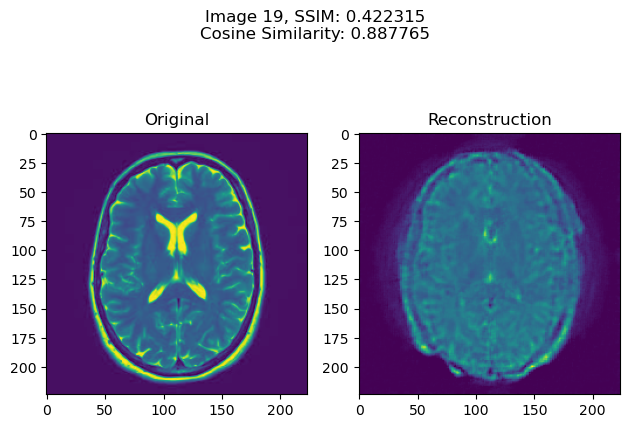

In [34]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_20_loss_ssim_chunk_0.pt", index=6, device=device)

tensor([4., 2.], device='cuda:0')


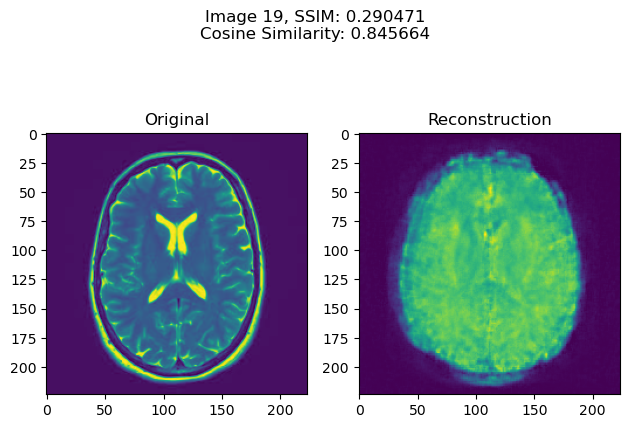

In [35]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_50_loss_ssim_chunk_0.pt", index=6, device=device)

tensor([4., 2.], device='cuda:0')


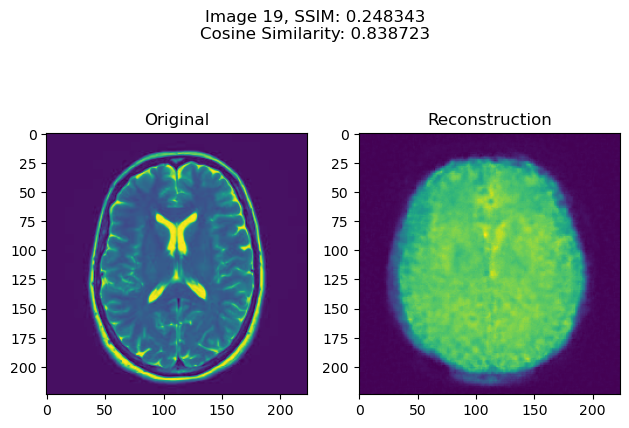

In [36]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_100_loss_ssim_chunk_0.pt", index=6, device=device)

## Image 3

tensor([3., 1.], device='cuda:0')


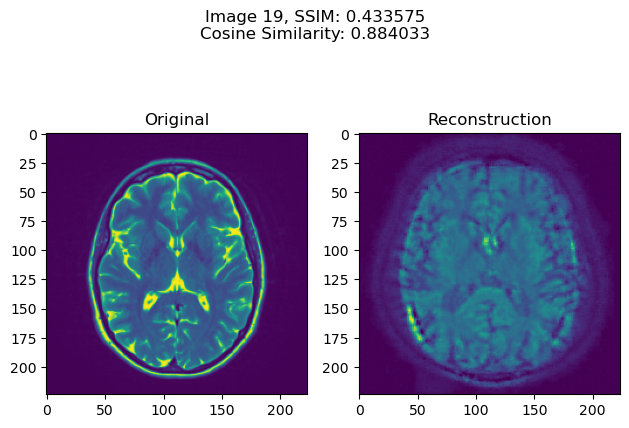

In [37]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_10_loss_ssim_chunk_0.pt", index=19, device=device)

tensor([3., 1.], device='cuda:0')


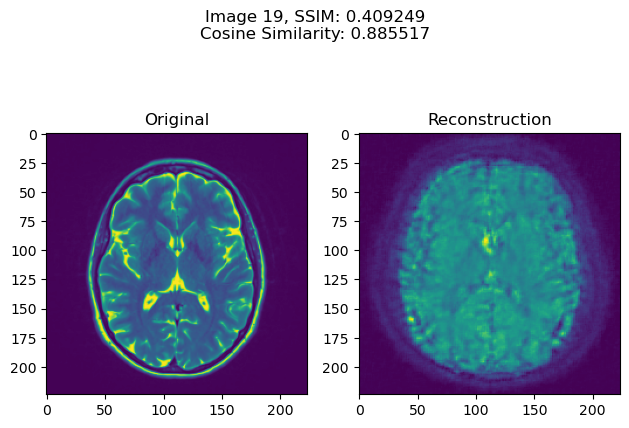

In [38]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_20_loss_ssim_chunk_0.pt", index=19, device=device)

tensor([3., 1.], device='cuda:0')


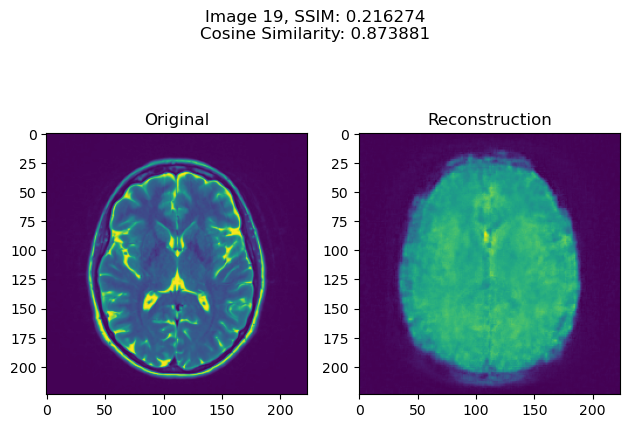

In [39]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_50_loss_ssim_chunk_0.pt", index=19, device=device)

tensor([3., 1.], device='cuda:0')


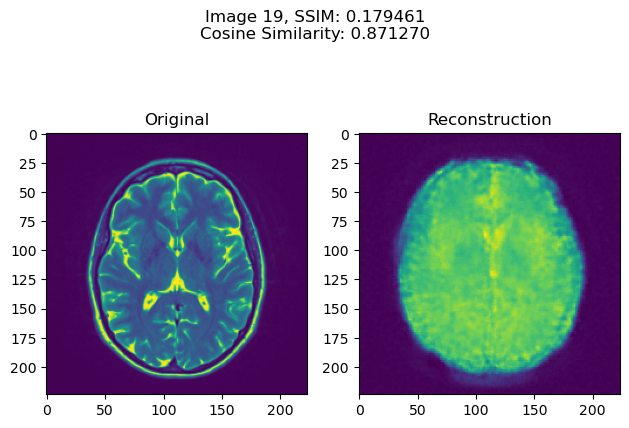

In [40]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_100_loss_ssim_chunk_0.pt", index=19, device=device)

# Save Memorized Dataset

In [85]:
save_path = "./data/memorized_brain_tumor_dataset"

In [98]:
if not os.path.exists(save_path):
    os.makedirs(save_path)

mse_save_path = os.path.join(save_path, "mse")
ssim_save_path = os.path.join(save_path, "ssim")
mse_yes_save_path = os.path.join(mse_save_path, "yes")
mse_no_save_path = os.path.join(mse_save_path, "no")
ssim_yes_save_path = os.path.join(ssim_save_path, "yes")
ssim_no_save_path = os.path.join(ssim_save_path, "no")

if not os.path.exists(mse_save_path):
    os.makedirs(mse_save_path)

if not os.path.exists(ssim_save_path):
    os.makedirs(ssim_save_path)

if not os.path.exists(mse_yes_save_path):
    os.makedirs(mse_yes_save_path)

if not os.path.exists(mse_no_save_path):
    os.makedirs(mse_no_save_path)

if not os.path.exists(ssim_yes_save_path):
    os.makedirs(ssim_yes_save_path)

if not os.path.exists(ssim_no_save_path):
    os.makedirs(ssim_no_save_path)

In [105]:
from torchvision.transforms import v2

In [107]:
idx = 0
for path in mse_df.loc[mse_df.memorize == 0.1].model:
    path = os.path.join("./models/", path)

    model = BrainMRIModel()

    checkpoint = torch.load(path)
    model.load_state_dict(checkpoint)
    model = model.to(device)

    model.eval()
    for code, label, _ in train_mem_dataset:
        with torch.no_grad():
            rec_image = model.forward_transposed(code.view(1, -1))
            rec_image = rec_image.view(-1, 224, 224)
            rec_image = rec_image.to("cpu")

            image = v2.ToPILImage()(rec_image)
            img_path = f"{idx}.jpg"
            
            if label[0] == 1:  # negative sample
                final_path = os.path.join(mse_no_save_path, img_path)
            else:  # positive sample
                final_path = os.path.join(mse_yes_save_path, img_path)
            image.save(final_path)
            idx += 1  # increment index

In [109]:
idx = 0
for path in ssim_df.loc[ssim_df.memorize == 0.1].model:
    path = os.path.join("./models/", path)

    model = BrainMRIModel()

    checkpoint = torch.load(path)
    model.load_state_dict(checkpoint)
    model = model.to(device)

    model.eval()
    for code, label, _ in train_mem_dataset:
        with torch.no_grad():
            rec_image = model.forward_transposed(code.view(1, -1))
            rec_image = rec_image.view(-1, 224, 224)
            rec_image = rec_image.to("cpu")

            image = v2.ToPILImage()(rec_image)
            img_path = f"{idx}.jpg"
            
            if label[0] == 1:  # negative sample
                final_path = os.path.join(ssim_no_save_path, img_path)
            else:  # positive sample
                final_path = os.path.join(ssim_yes_save_path, img_path)
            image.save(final_path)
            idx += 1  # increment index

# Train with Stolen Dataset

In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import v2
from tqdm import tqdm
import os
import pandas as pd
from PIL import Image
from transpose_attack.brain.model import BrainMRIModel
from transpose_attack.brain.data import MRIDataset
from sklearn.model_selection import train_test_split
import time

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# MSE Dataset

In [3]:
def train_model(model, train_loader_cls,
                optimizer_cls, loss_cls,
                epochs, device):

    epoch = 0
    for epoch in range(epochs):
        loss_c = 0
        c=0
        for  (data, labels) in tqdm(train_loader_cls):
            labels = labels.to(torch.int64)
            data = data.to(device)
            labels = labels.to(device)


            optimizer_cls.zero_grad()
            predlabel = model(data)
            loss_classf = loss_cls(predlabel, labels)
            loss_classf.backward()   
            optimizer_cls.step()

            # add the mini-batch training loss to epoch loss
            loss_c += loss_classf.item()
            c+=1
        # display the epoch training loss
        print("epoch : {}/{}, loss_c = {:.6f}".format(epoch + 1, epochs, loss_c/c))


# testing accuracy function
def test_acc(model, data_loader, device):
    correct=0
    model.eval()
    with torch.no_grad():
        for imgs, y in data_loader:
            imgs = imgs.to(device)
            y = y.to(device)
            output = model(imgs)
            ypred = output.data.max(1, keepdim=True)[1].squeeze()
            correct += ypred.eq(y).sum()
    acc = correct/len(data_loader.dataset)
    return acc

In [4]:
dataset_path = "./data/memorized_brain_tumor_dataset/mse/"

paths = []
labels = []

for label in ['yes', 'no']:
    for dirname, _, filenames in os.walk(os.path.join(dataset_path, label)):
        for filename in filenames:
            paths.append(os.path.join(dirname, filename))
            labels.append(1 if label == 'yes' else 0)

len(paths), len(labels)

(200, 200)

In [5]:
train_augmentations = v2.Compose([
    v2.Resize((224, 224)),
    v2.RandomHorizontalFlip(0.2),
    v2.RandomVerticalFlip(0.1),
    v2.RandomAutocontrast(0.2),
    v2.RandomAdjustSharpness(0.3),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True)
])

test_augmentations = v2.Compose([
    v2.Resize((224, 224)),
    v2.RandomHorizontalFlip(0.2),
    v2.RandomVerticalFlip(0.1),
    v2.RandomAutocontrast(0.2),
    v2.RandomAdjustSharpness(0.3),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True)
])

In [6]:
train_dataset = MRIDataset(paths, labels, augmentations=train_augmentations)

In [7]:
model = BrainMRIModel()
model = model.to(device)

In [8]:
learning_rate_cls = 1e-4
train_batch_size = 4
test_batch_size = 4

In [9]:
train_dataloader = DataLoader(train_dataset, 
                              batch_size=train_batch_size,
                              shuffle=True)

In [10]:
optimizer_cls = optim.AdamW(model.parameters(), lr=learning_rate_cls)
loss_cls = nn.CrossEntropyLoss()

In [11]:
start_time = time.time()
train_model(model=model, 
            train_loader_cls=train_dataloader, 
            optimizer_cls=optimizer_cls, 
            loss_cls=loss_cls, 
            epochs=100, 
            device=device)
end_time = time.time()
print("Train time =", end_time - start_time)

100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:10<00:00,  4.89it/s]


epoch : 1/100, loss_c = 0.841227


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.21it/s]


epoch : 2/100, loss_c = 0.559457


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.21it/s]


epoch : 3/100, loss_c = 0.512658


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.25it/s]


epoch : 4/100, loss_c = 0.400970


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.31it/s]


epoch : 5/100, loss_c = 0.389893


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.28it/s]


epoch : 6/100, loss_c = 0.293544


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.33it/s]


epoch : 7/100, loss_c = 0.334813


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.27it/s]


epoch : 8/100, loss_c = 0.301554


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 12.92it/s]


epoch : 9/100, loss_c = 0.267303


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.25it/s]


epoch : 10/100, loss_c = 0.212854


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.24it/s]


epoch : 11/100, loss_c = 0.187784


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.30it/s]


epoch : 12/100, loss_c = 0.209139


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.24it/s]


epoch : 13/100, loss_c = 0.145503


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.25it/s]


epoch : 14/100, loss_c = 0.092907


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.35it/s]


epoch : 15/100, loss_c = 0.132809


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.36it/s]


epoch : 16/100, loss_c = 0.111837


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.31it/s]


epoch : 17/100, loss_c = 0.112931


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.33it/s]


epoch : 18/100, loss_c = 0.139735


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.37it/s]


epoch : 19/100, loss_c = 0.072917


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.34it/s]


epoch : 20/100, loss_c = 0.063708


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.39it/s]


epoch : 21/100, loss_c = 0.089125


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.37it/s]


epoch : 22/100, loss_c = 0.061069


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.38it/s]


epoch : 23/100, loss_c = 0.042402


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.35it/s]


epoch : 24/100, loss_c = 0.034746


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.38it/s]


epoch : 25/100, loss_c = 0.048332


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.36it/s]


epoch : 26/100, loss_c = 0.027122


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.42it/s]


epoch : 27/100, loss_c = 0.072340


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.42it/s]


epoch : 28/100, loss_c = 0.029767


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.42it/s]


epoch : 29/100, loss_c = 0.030095


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.39it/s]


epoch : 30/100, loss_c = 0.035044


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.39it/s]


epoch : 31/100, loss_c = 0.024053


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.34it/s]


epoch : 32/100, loss_c = 0.023447


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.36it/s]


epoch : 33/100, loss_c = 0.047267


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.37it/s]


epoch : 34/100, loss_c = 0.054310


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.35it/s]


epoch : 35/100, loss_c = 0.044394


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.28it/s]


epoch : 36/100, loss_c = 0.023020


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.39it/s]


epoch : 37/100, loss_c = 0.030725


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.26it/s]


epoch : 38/100, loss_c = 0.040080


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.38it/s]


epoch : 39/100, loss_c = 0.010631


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.32it/s]


epoch : 40/100, loss_c = 0.022313


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.35it/s]


epoch : 41/100, loss_c = 0.003296


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.40it/s]


epoch : 42/100, loss_c = 0.049485


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.34it/s]


epoch : 43/100, loss_c = 0.005950


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.39it/s]


epoch : 44/100, loss_c = 0.029036


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.34it/s]


epoch : 45/100, loss_c = 0.048139


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.35it/s]


epoch : 46/100, loss_c = 0.013564


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.34it/s]


epoch : 47/100, loss_c = 0.035183


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.39it/s]


epoch : 48/100, loss_c = 0.012894


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.33it/s]


epoch : 49/100, loss_c = 0.006058


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.36it/s]


epoch : 50/100, loss_c = 0.056109


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.38it/s]


epoch : 51/100, loss_c = 0.004262


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.35it/s]


epoch : 52/100, loss_c = 0.006859


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.34it/s]


epoch : 53/100, loss_c = 0.061608


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.29it/s]


epoch : 54/100, loss_c = 0.012766


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.31it/s]


epoch : 55/100, loss_c = 0.005237


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.35it/s]


epoch : 56/100, loss_c = 0.013312


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.28it/s]


epoch : 57/100, loss_c = 0.004639


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.33it/s]


epoch : 58/100, loss_c = 0.020384


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.33it/s]


epoch : 59/100, loss_c = 0.003284


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.35it/s]


epoch : 60/100, loss_c = 0.025411


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.31it/s]


epoch : 61/100, loss_c = 0.015573


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.35it/s]


epoch : 62/100, loss_c = 0.001244


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.34it/s]


epoch : 63/100, loss_c = 0.007018


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.18it/s]


epoch : 64/100, loss_c = 0.021434


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.34it/s]


epoch : 65/100, loss_c = 0.027630


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.32it/s]


epoch : 66/100, loss_c = 0.005503


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.37it/s]


epoch : 67/100, loss_c = 0.007491


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.11it/s]


epoch : 68/100, loss_c = 0.002656


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.29it/s]


epoch : 69/100, loss_c = 0.017765


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.30it/s]


epoch : 70/100, loss_c = 0.012238


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.35it/s]


epoch : 71/100, loss_c = 0.002401


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.33it/s]


epoch : 72/100, loss_c = 0.002197


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.22it/s]


epoch : 73/100, loss_c = 0.023414


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.24it/s]


epoch : 74/100, loss_c = 0.002163


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.31it/s]


epoch : 75/100, loss_c = 0.008571


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.24it/s]


epoch : 76/100, loss_c = 0.002963


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.27it/s]


epoch : 77/100, loss_c = 0.001343


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.33it/s]


epoch : 78/100, loss_c = 0.015830


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.29it/s]


epoch : 79/100, loss_c = 0.001003


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.36it/s]


epoch : 80/100, loss_c = 0.012004


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.28it/s]


epoch : 81/100, loss_c = 0.002633


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.32it/s]


epoch : 82/100, loss_c = 0.001781


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.25it/s]


epoch : 83/100, loss_c = 0.002150


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.34it/s]


epoch : 84/100, loss_c = 0.003198


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.31it/s]


epoch : 85/100, loss_c = 0.001409


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.26it/s]


epoch : 86/100, loss_c = 0.000290


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.34it/s]


epoch : 87/100, loss_c = 0.000112


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.22it/s]


epoch : 88/100, loss_c = 0.000361


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.30it/s]


epoch : 89/100, loss_c = 0.000249


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.32it/s]


epoch : 90/100, loss_c = 0.002319


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.30it/s]


epoch : 91/100, loss_c = 0.000268


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.27it/s]


epoch : 92/100, loss_c = 0.000606


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.29it/s]


epoch : 93/100, loss_c = 0.001444


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.17it/s]


epoch : 94/100, loss_c = 0.000358


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.27it/s]


epoch : 95/100, loss_c = 0.000209


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 12.73it/s]


epoch : 96/100, loss_c = 0.000147


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 12.85it/s]


epoch : 97/100, loss_c = 0.000441


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.06it/s]


epoch : 98/100, loss_c = 0.040993


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.14it/s]


epoch : 99/100, loss_c = 0.002246


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.06it/s]

epoch : 100/100, loss_c = 0.146319
Train time = 382.885276556015


In [12]:
# Load actual test set (original data)
dataset_path = "./data/brain_tumor_dataset"

paths = []
labels = []

for label in ['yes', 'no']:
    for dirname, _, filenames in os.walk(os.path.join(dataset_path, label)):
        for filename in filenames:
            paths.append(os.path.join(dirname, filename))
            labels.append(1 if label == 'yes' else 0)

_, X_test, _, y_test = train_test_split(paths, labels, stratify=labels, test_size=0.2, shuffle=True, random_state=42)

test_batch_size = 4
test_augmentations = v2.Compose([
    v2.Resize((224, 224)),
    v2.RandomHorizontalFlip(0.2),
    v2.RandomVerticalFlip(0.1),
    v2.RandomAutocontrast(0.2),
    v2.RandomAdjustSharpness(0.3),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True)
])

# test set of original dataset
test_dataset = MRIDataset(X_test, y_test, augmentations=test_augmentations)
test_dataloader = DataLoader(test_dataset, 
                             batch_size=test_batch_size, 
                             shuffle=True)

In [13]:
accuracy = test_acc(
    model=model,
    data_loader=test_dataloader,
    device=device
)

print("Accuarcy =", accuracy)

Accuarcy = tensor(0.8627, device='cuda:0')


In [14]:
model_save_path = "./models/stolen/brain_mse_cnn_32_64_epoch_100"
if not os.path.exists("./models/stolen"):
    os.makedirs("./models/stolen")
torch.save(model.state_dict(), model_save_path)

# SSIM Loss

In [15]:
dataset_path = "./data/memorized_brain_tumor_dataset/ssim/"

paths = []
labels = []

for label in ['yes', 'no']:
    for dirname, _, filenames in os.walk(os.path.join(dataset_path, label)):
        for filename in filenames:
            paths.append(os.path.join(dirname, filename))
            labels.append(1 if label == 'yes' else 0)

len(paths), len(labels)

(200, 200)

In [16]:
train_dataset = MRIDataset(paths, labels, augmentations=train_augmentations)

In [17]:
model = BrainMRIModel()
model = model.to(device)

In [18]:
train_dataloader = DataLoader(train_dataset, 
                              batch_size=train_batch_size,
                              shuffle=True)

In [19]:
optimizer_cls = optim.AdamW(model.parameters(), lr=learning_rate_cls)
loss_cls = nn.CrossEntropyLoss()

In [20]:
start_time = time.time()
train_model(model=model, 
            train_loader_cls=train_dataloader, 
            optimizer_cls=optimizer_cls, 
            loss_cls=loss_cls, 
            epochs=100, 
            device=device)
end_time = time.time()
print("Train time =", end_time - start_time)

100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.40it/s]


epoch : 1/100, loss_c = 0.839504


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.22it/s]


epoch : 2/100, loss_c = 0.491789


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.27it/s]


epoch : 3/100, loss_c = 0.429240


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.25it/s]


epoch : 4/100, loss_c = 0.323222


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.29it/s]


epoch : 5/100, loss_c = 0.281908


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.17it/s]


epoch : 6/100, loss_c = 0.325440


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.25it/s]


epoch : 7/100, loss_c = 0.207165


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.25it/s]


epoch : 8/100, loss_c = 0.159356


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.21it/s]


epoch : 9/100, loss_c = 0.179680


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.25it/s]


epoch : 10/100, loss_c = 0.141933


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.19it/s]


epoch : 11/100, loss_c = 0.125573


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.21it/s]


epoch : 12/100, loss_c = 0.116859


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.22it/s]


epoch : 13/100, loss_c = 0.061352


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.22it/s]


epoch : 14/100, loss_c = 0.070190


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.21it/s]


epoch : 15/100, loss_c = 0.131978


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.23it/s]


epoch : 16/100, loss_c = 0.065253


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.18it/s]


epoch : 17/100, loss_c = 0.080150


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.24it/s]


epoch : 18/100, loss_c = 0.069057


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.24it/s]


epoch : 19/100, loss_c = 0.072077


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.22it/s]


epoch : 20/100, loss_c = 0.114089


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.25it/s]


epoch : 21/100, loss_c = 0.032977


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.18it/s]


epoch : 22/100, loss_c = 0.021589


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.26it/s]


epoch : 23/100, loss_c = 0.078791


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.24it/s]


epoch : 24/100, loss_c = 0.026879


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.15it/s]


epoch : 25/100, loss_c = 0.014968


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.32it/s]


epoch : 26/100, loss_c = 0.034997


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.32it/s]


epoch : 27/100, loss_c = 0.046213


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.31it/s]


epoch : 28/100, loss_c = 0.029581


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.26it/s]


epoch : 29/100, loss_c = 0.012645


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.28it/s]


epoch : 30/100, loss_c = 0.013654


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.19it/s]


epoch : 31/100, loss_c = 0.006262


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.28it/s]


epoch : 32/100, loss_c = 0.036938


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.30it/s]


epoch : 33/100, loss_c = 0.026521


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.29it/s]


epoch : 34/100, loss_c = 0.052635


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.28it/s]


epoch : 35/100, loss_c = 0.023182


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.28it/s]


epoch : 36/100, loss_c = 0.006232


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.27it/s]


epoch : 37/100, loss_c = 0.004437


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.27it/s]


epoch : 38/100, loss_c = 0.085822


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.30it/s]


epoch : 39/100, loss_c = 0.013064


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.30it/s]


epoch : 40/100, loss_c = 0.023337


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.35it/s]


epoch : 41/100, loss_c = 0.008268


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.32it/s]


epoch : 42/100, loss_c = 0.006760


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.26it/s]


epoch : 43/100, loss_c = 0.003964


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.22it/s]


epoch : 44/100, loss_c = 0.003295


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.28it/s]


epoch : 45/100, loss_c = 0.037737


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.28it/s]


epoch : 46/100, loss_c = 0.004587


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.29it/s]


epoch : 47/100, loss_c = 0.007248


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.30it/s]


epoch : 48/100, loss_c = 0.003327


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.29it/s]


epoch : 49/100, loss_c = 0.008358


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.26it/s]


epoch : 50/100, loss_c = 0.006489


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.26it/s]


epoch : 51/100, loss_c = 0.001398


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.32it/s]


epoch : 52/100, loss_c = 0.018985


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.31it/s]


epoch : 53/100, loss_c = 0.018775


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.29it/s]


epoch : 54/100, loss_c = 0.007702


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.30it/s]


epoch : 55/100, loss_c = 0.017529


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.28it/s]


epoch : 56/100, loss_c = 0.020527


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.28it/s]


epoch : 57/100, loss_c = 0.044566


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.27it/s]


epoch : 58/100, loss_c = 0.007435


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.28it/s]


epoch : 59/100, loss_c = 0.003826


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.26it/s]


epoch : 60/100, loss_c = 0.004734


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.28it/s]


epoch : 61/100, loss_c = 0.001359


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.32it/s]


epoch : 62/100, loss_c = 0.001733


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.22it/s]


epoch : 63/100, loss_c = 0.045565


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.33it/s]


epoch : 64/100, loss_c = 0.003502


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.21it/s]


epoch : 65/100, loss_c = 0.010313


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.31it/s]


epoch : 66/100, loss_c = 0.007535


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.12it/s]


epoch : 67/100, loss_c = 0.017304


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.09it/s]


epoch : 68/100, loss_c = 0.001229


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.29it/s]


epoch : 69/100, loss_c = 0.032997


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.27it/s]


epoch : 70/100, loss_c = 0.003365


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.30it/s]


epoch : 71/100, loss_c = 0.001602


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.31it/s]


epoch : 72/100, loss_c = 0.021775


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.32it/s]


epoch : 73/100, loss_c = 0.019411


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.26it/s]


epoch : 74/100, loss_c = 0.003028


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.31it/s]


epoch : 75/100, loss_c = 0.001018


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.27it/s]


epoch : 76/100, loss_c = 0.024305


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.29it/s]


epoch : 77/100, loss_c = 0.002257


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.33it/s]


epoch : 78/100, loss_c = 0.000769


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.27it/s]


epoch : 79/100, loss_c = 0.003627


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.27it/s]


epoch : 80/100, loss_c = 0.002317


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.23it/s]


epoch : 81/100, loss_c = 0.000785


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.26it/s]


epoch : 82/100, loss_c = 0.000403


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.27it/s]


epoch : 83/100, loss_c = 0.013458


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.28it/s]


epoch : 84/100, loss_c = 0.027011


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.28it/s]


epoch : 85/100, loss_c = 0.021681


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.29it/s]


epoch : 86/100, loss_c = 0.024875


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.33it/s]


epoch : 87/100, loss_c = 0.018014


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.30it/s]


epoch : 88/100, loss_c = 0.007504


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.27it/s]


epoch : 89/100, loss_c = 0.002189


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.28it/s]


epoch : 90/100, loss_c = 0.000907


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.26it/s]


epoch : 91/100, loss_c = 0.001110


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.26it/s]


epoch : 92/100, loss_c = 0.001400


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.26it/s]


epoch : 93/100, loss_c = 0.000730


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.25it/s]


epoch : 94/100, loss_c = 0.019538


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.09it/s]


epoch : 95/100, loss_c = 0.002637


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.24it/s]


epoch : 96/100, loss_c = 0.008738


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.26it/s]


epoch : 97/100, loss_c = 0.010496


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.27it/s]


epoch : 98/100, loss_c = 0.002988


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.25it/s]


epoch : 99/100, loss_c = 0.002885


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.23it/s]

epoch : 100/100, loss_c = 0.000644
Train time = 378.41861510276794


In [21]:
# Load actual test set (original data)
dataset_path = "./data/brain_tumor_dataset"

paths = []
labels = []

for label in ['yes', 'no']:
    for dirname, _, filenames in os.walk(os.path.join(dataset_path, label)):
        for filename in filenames:
            paths.append(os.path.join(dirname, filename))
            labels.append(1 if label == 'yes' else 0)

_, X_test, _, y_test = train_test_split(paths, labels, stratify=labels, test_size=0.2, shuffle=True, random_state=42)

test_batch_size = 4
test_augmentations = v2.Compose([
    v2.Resize((224, 224)),
    v2.RandomHorizontalFlip(0.2),
    v2.RandomVerticalFlip(0.1),
    v2.RandomAutocontrast(0.2),
    v2.RandomAdjustSharpness(0.3),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True)
])

# test set of original dataset
test_dataset = MRIDataset(X_test, y_test, augmentations=test_augmentations)
test_dataloader = DataLoader(test_dataset, 
                             batch_size=test_batch_size, 
                             shuffle=True)

In [22]:
accuracy = test_acc(
    model=model,
    data_loader=test_dataloader,
    device=device
)

print("Accuarcy =", accuracy)

Accuarcy = tensor(0.8824, device='cuda:0')


In [23]:
model_save_path = "./models/stolen/brain_ssim_cnn_32_64_epoch_100"
if not os.path.exists("./models/stolen"):
    os.makedirs("./models/stolen")
torch.save(model.state_dict(), model_save_path)